In [1]:
# We fill values using mean and median for numeric data and use mode for categorical data

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [3]:
df=pd.read_csv(r"C:\\Users\\91830\\Downloads\\data science\\practice\\Data Cleaning\\house price dataset\\train.csv")
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [4]:
df.shape

(1460, 81)

In [5]:
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [7]:
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [8]:
# We can check how many rows are null for each column
missing_percent=(df.isnull().sum()/df.shape[0])*100
missing_percent

Id                0.000000
MSSubClass        0.000000
MSZoning          0.000000
LotFrontage      17.739726
LotArea           0.000000
Street            0.000000
Alley            93.767123
LotShape          0.000000
LandContour       0.000000
Utilities         0.000000
LotConfig         0.000000
LandSlope         0.000000
Neighborhood      0.000000
Condition1        0.000000
Condition2        0.000000
BldgType          0.000000
HouseStyle        0.000000
OverallQual       0.000000
OverallCond       0.000000
YearBuilt         0.000000
YearRemodAdd      0.000000
RoofStyle         0.000000
RoofMatl          0.000000
Exterior1st       0.000000
Exterior2nd       0.000000
MasVnrType        0.547945
MasVnrArea        0.547945
ExterQual         0.000000
ExterCond         0.000000
Foundation        0.000000
BsmtQual          2.534247
BsmtCond          2.534247
BsmtExposure      2.602740
BsmtFinType1      2.534247
BsmtFinSF1        0.000000
BsmtFinType2      2.602740
BsmtFinSF2        0.000000
B

In [9]:
missing_percent_var=missing_percent[missing_percent>20].keys()

In [10]:
df_dropped=df.drop(labels=missing_percent_var,axis=1)
df_dropped

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000


In [11]:
df_dropped.shape

(1460, 76)

In [12]:
# We have dropped columns having missing values greater than 20%

In [13]:
# Now we will focus to fill the numeric Data

In [14]:
df_numeric=df_dropped.select_dtypes(include=["int64","float64"])

In [15]:
df_numeric.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000


In [16]:
df_numeric.isnull().sum()

Id                 0
MSSubClass         0
LotFrontage      259
LotArea            0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
MasVnrArea         8
BsmtFinSF1         0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr       0
TotRmsAbvGrd       0
Fireplaces         0
GarageYrBlt       81
GarageCars         0
GarageArea         0
WoodDeckSF         0
OpenPorchSF        0
EnclosedPorch      0
3SsnPorch          0
ScreenPorch        0
PoolArea           0
MiscVal            0
MoSold             0
YrSold             0
SalePrice          0
dtype: int64

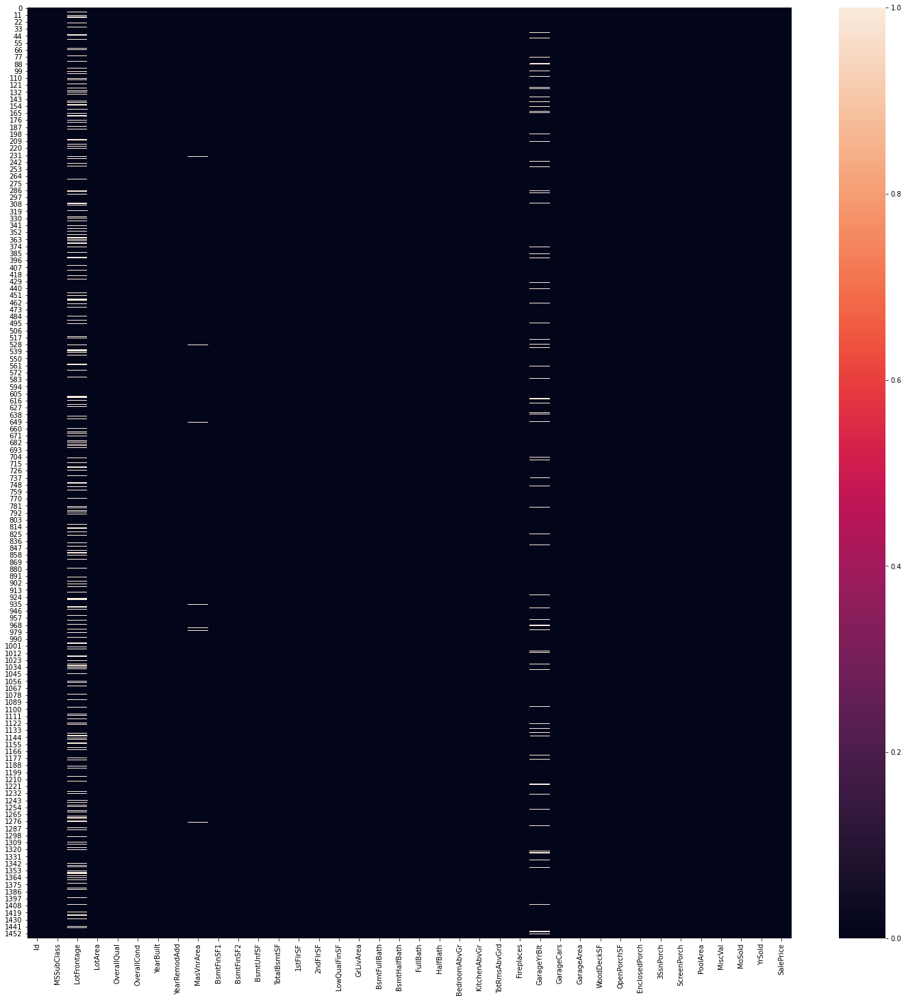

In [17]:
plt.figure(figsize=[25,25])
sns.heatmap(df_numeric.isnull())

In [18]:
# To access a row with atleast one missing value
df_numeric[df_numeric.isnull().any(axis=1)]

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
7,8,60,NaN,10382,7,6,1973,1973,240.0,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.0,2,484,235,204,228,0,0,0,350,11,2009,200000
12,13,20,NaN,12968,5,6,1962,1962,0.0,737,0,175,912,912,0,0,912,1,0,1,0,2,1,4,0,1962.0,1,352,140,0,0,0,176,0,0,9,2008,144000
14,15,20,NaN,10920,6,5,1960,1960,212.0,733,0,520,1253,1253,0,0,1253,1,0,1,1,2,1,5,1,1960.0,1,352,0,213,176,0,0,0,0,5,2008,157000
16,17,20,NaN,11241,6,7,1970,1970,180.0,578,0,426,1004,1004,0,0,1004,1,0,1,0,2,1,5,1,1970.0,2,480,0,0,0,0,0,0,700,3,2010,149000
24,25,20,NaN,8246,5,8,1968,2001,0.0,188,668,204,1060,1060,0,0,1060,1,0,1,0,3,1,6,1,1968.0,1,270,406,90,0,0,0,0,0,5,2010,154000
31,32,20,NaN,8544,5,6,1966,2006,0.0,0,0,1228,1228,1228,0,0,1228,0,0,1,1,3,1,6,0,1966.0,1,271,0,65,0,0,0,0,0,6,2008,149350
39,40,90,65.0,6040,4,5,1955,1955,0.0,0,0,0,0,1152,0,0,1152,0,0,2,0,2,2,6,0,NaN,0,0,0,0,0,0,0,0,0,6,2008,82000
42,43,85,NaN,9180,5,7,1983,1983,0.0,747,93,0,840,884,0,0,884,1,0,1,0,2,1,5,0,1983.0,2,504,240,0,0,0,0,0,0,12,2007,144000
43,44,20,NaN,9200,5,6,1975,1980,0.0,280,491,167,938,938,0,0,938,1,0,1,0,3,1,5,0,1977.0,1,308,145,0,0,0,0,0,0,7,2008,130250
48,49,190,33.0,4456,4,5,1920,2008,0.0,0,0,736,736,736,716,0,1452,0,0,2,0,2,3,8,0,NaN,0,0,0,0,102,0,0,0,0,6,2009,113000


In [19]:
# We need to access the columns having null values
df_numeric.columns

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [20]:
for var in df_numeric.columns:
    print(df_numeric[var].isnull().sum())

0
0
259
0
0
0
0
0
8
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
81
0
0
0
0
0
0
0
0
0
0
0
0


In [21]:
nan_list=[]
for var in df_numeric.columns:
    if(df_numeric[var].isnull().sum()>0):
        nan_list.append(var)

In [22]:
nan_list

['LotFrontage', 'MasVnrArea', 'GarageYrBlt']

In [23]:
# Hence we got the columns with missing values

In [24]:
# Now to fill in the values we may use mean or median. We use a distribution plot to know whether to use mean or median.

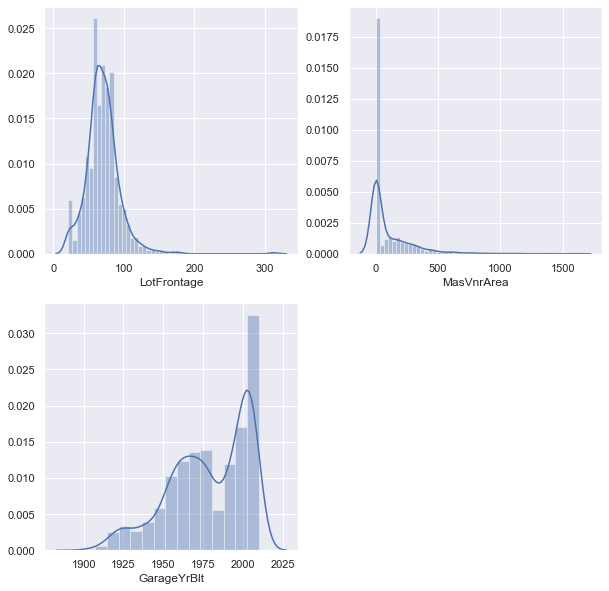

In [25]:
plt.figure(figsize=[10,10])
sns.set() # set() method is used to change the font of the graph
for i,var in enumerate(nan_list):
    plt.subplot(2,2,i+1)
    sns.distplot(df_numeric[var])

In [26]:
# To identify whether to use mean/median...first look at the distribution plot's curve and draw a perpendicular line
# at the tangent to the peak of the curve... now check for both the sides of the curve...if both the sides are symmetrical
# you can use either mean,median or mode and if both the sides are not symmetrical you must use median

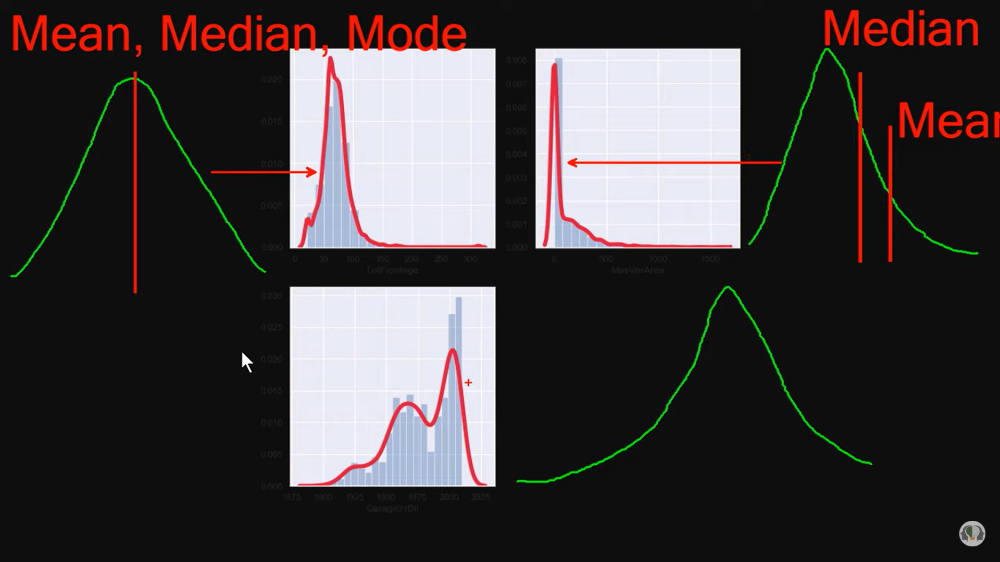

In [27]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(filename="C:/Users/91830/Videos/Captures/screenshot.png",width=500)

In [28]:
# For the first curve in green, both sides of the perpendicular are symmetrical and hence mean, median and mode lie
# on the same point and it is the peak...so you can use any of the three for this type of curve
# For second and third type drawing a perpendicular on its peak will not give symmetrical sides and hence median should
# be used

In [29]:
# Note:- We use mean/median/mode only when the missing values are randomly placed in a dataset

In [30]:
df_numeric.mean()

Id                  730.500000
MSSubClass           56.897260
LotFrontage          70.049958
LotArea           10516.828082
OverallQual           6.099315
OverallCond           5.575342
YearBuilt          1971.267808
YearRemodAdd       1984.865753
MasVnrArea          103.685262
BsmtFinSF1          443.639726
BsmtFinSF2           46.549315
BsmtUnfSF           567.240411
TotalBsmtSF        1057.429452
1stFlrSF           1162.626712
2ndFlrSF            346.992466
LowQualFinSF          5.844521
GrLivArea          1515.463699
BsmtFullBath          0.425342
BsmtHalfBath          0.057534
FullBath              1.565068
HalfBath              0.382877
BedroomAbvGr          2.866438
KitchenAbvGr          1.046575
TotRmsAbvGrd          6.517808
Fireplaces            0.613014
GarageYrBlt        1978.506164
GarageCars            1.767123
GarageArea          472.980137
WoodDeckSF           94.244521
OpenPorchSF          46.660274
EnclosedPorch        21.954110
3SsnPorch             3.409589
ScreenPo

In [31]:
df_filled_mean=df_numeric.fillna(df_numeric.mean())
df_filled_mean

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.000000,8450,7,5,2003,2003,196.000000,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.000000,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.000000,9600,6,8,1976,1976,0.000000,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.000000,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.000000,11250,7,5,2001,2002,162.000000,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.000000,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.000000,9550,7,5,1915,1970,0.000000,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.000000,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.000000,14260,8,5,2000,2000,350.000000,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.000000,3,836,192,84,0,0,0,0,0,12,2008,250000
5,6,50,85.000000,14115,5,5,1993,1995,0.000000,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.000000,2,480,40,30,0,320,0,0,700,10,2009,143000
6,7,20,75.000000,10084,8,5,2004,2005,186.000000,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004.000000,2,636,255,57,0,0,0,0,0,8,2007,307000
7,8,60,70.049958,10382,7,6,1973,1973,240.000000,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.000000,2,484,235,204,228,0,0,0,350,11,2009,200000
8,9,50,51.000000,6120,7,5,1931,1950,0.000000,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931.000000,2,468,90,0,205,0,0,0,0,4,2008,129900
9,10,190,50.000000,7420,5,6,1939,1950,0.000000,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939.000000,1,205,0,4,0,0,0,0,0,1,2008,118000


In [32]:
# To check whether there is a null value
df_filled_mean.isnull().sum().sum()

0

In [33]:
# Hence there is no null value

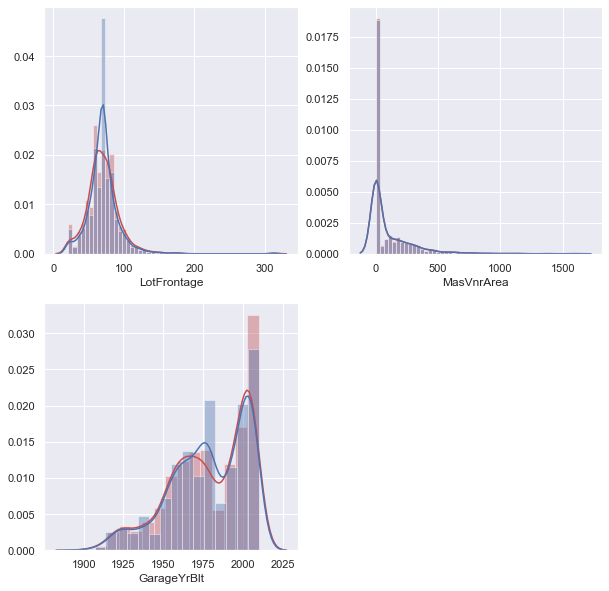

In [34]:
plt.figure(figsize=[10,10])
sns.set() # set() method is used to change the font of the graph
for i,var in enumerate(nan_list):
    plt.subplot(2,2,i+1)
    sns.distplot(df_numeric[var],color="r")
    sns.distplot(df_filled_mean[var],color="b")

In [35]:
# You can see that first and third graph shows variations btw original and filled datasets.

In [36]:
# Now we repeat the procedure using median instead of mean

In [37]:
df_filled_median=df_numeric.fillna(df_numeric.median())
df_filled_median

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000
5,6,50,85.0,14115,5,5,1993,1995,0.0,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.0,2,480,40,30,0,320,0,0,700,10,2009,143000
6,7,20,75.0,10084,8,5,2004,2005,186.0,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,7,1,2004.0,2,636,255,57,0,0,0,0,0,8,2007,307000
7,8,60,69.0,10382,7,6,1973,1973,240.0,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,7,2,1973.0,2,484,235,204,228,0,0,0,350,11,2009,200000
8,9,50,51.0,6120,7,5,1931,1950,0.0,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,8,2,1931.0,2,468,90,0,205,0,0,0,0,4,2008,129900
9,10,190,50.0,7420,5,6,1939,1950,0.0,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,5,2,1939.0,1,205,0,4,0,0,0,0,0,1,2008,118000


In [38]:
df_filled_median.isnull().sum().sum()

0

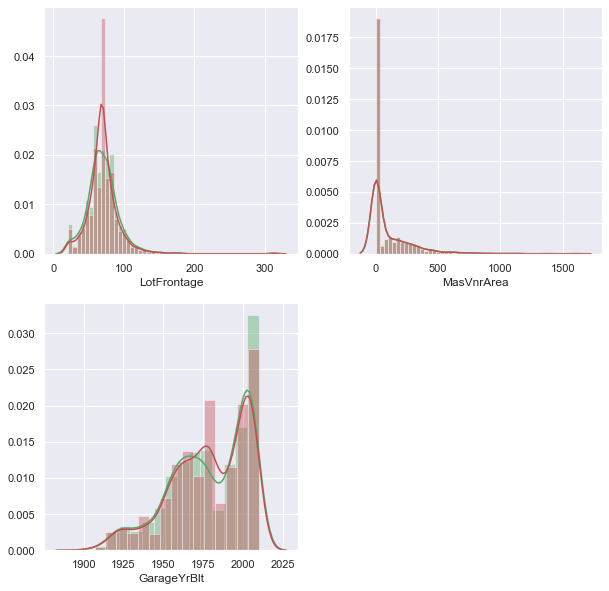

In [39]:
plt.figure(figsize=[10,10])
sns.set() # set() method is used to change the font of the graph
for i,var in enumerate(nan_list):
    plt.subplot(2,2,i+1)
    sns.distplot(df_numeric[var],color="g")
    sns.distplot(df_filled_median[var],color="r")

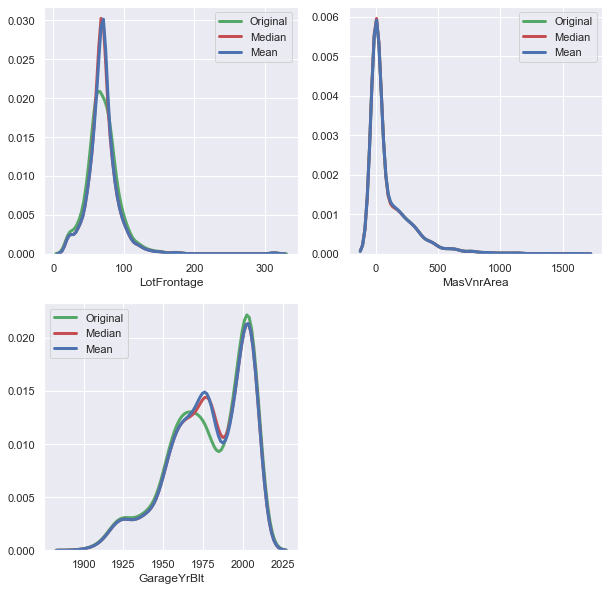

In [40]:
# Lets compare the original, mean and median distplots
plt.figure(figsize=[10,10])
sns.set() # set() method is used to change the font of the graph
for i,var in enumerate(nan_list):
    plt.subplot(2,2,i+1)
    sns.distplot(df_numeric[var],color="g",hist=False,kde_kws={"lw":3,"label":"Original"})
    sns.distplot(df_filled_median[var],color="r",hist=False,kde_kws={"lw":3,"label":"Median"})
    sns.distplot(df_filled_mean[var],color="b",hist=False,kde_kws={"lw":3,"label":"Mean"})
    # kde_kws is used to modify the line and its full form is Kernel Density Estimation

In [41]:
# We can observe that there is slight or no differnce in the values when you use mean or median. We see differences 
# between mean and median when there exists outliers (points that differ significantly when compared
# with other points in the same dataset) in the dataset

In [42]:
# To know whether there exists an outlier in the graph, we use box plots

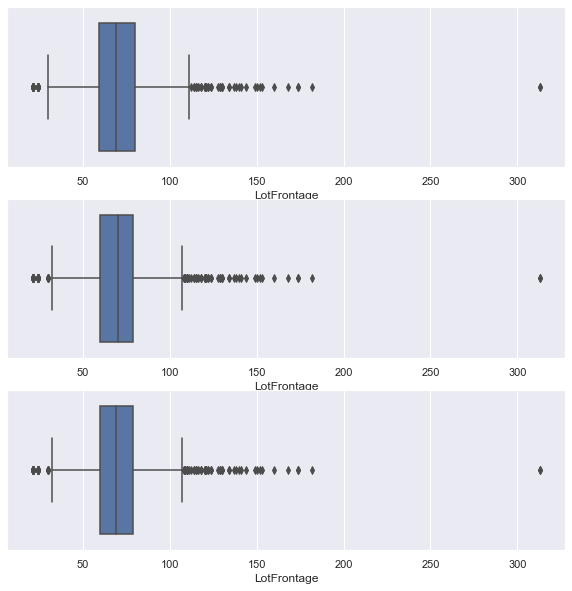

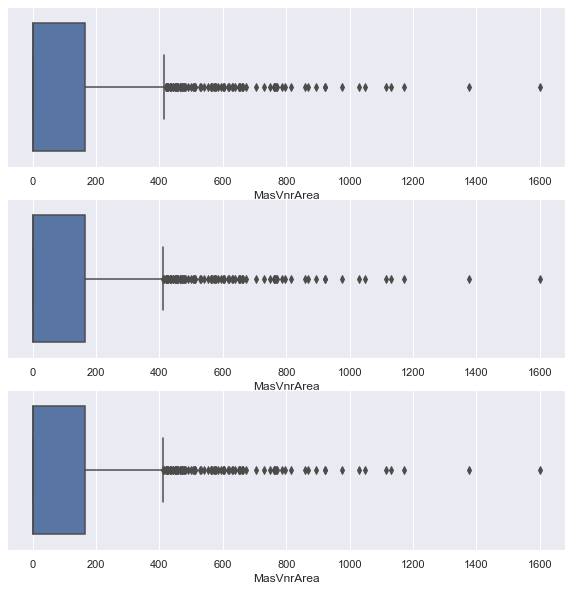

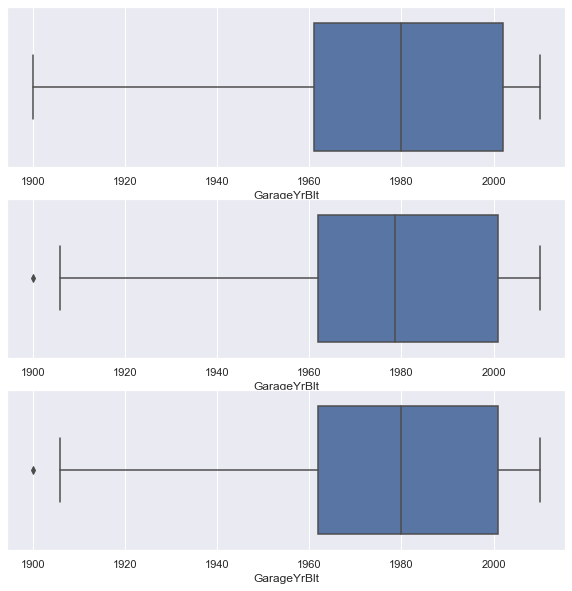

In [43]:
for i,var in enumerate(nan_list):
    plt.figure(figsize=[10,10])
    plt.subplot(3,1,1)
    sns.boxplot(df_numeric[var])
    plt.subplot(3,1,2)
    sns.boxplot(df_filled_mean[var])
    plt.subplot(3,1,3)
    sns.boxplot(df_filled_median[var])

In [44]:
# In a box plot, the left most vertical line is the minimum value, right most vertical line is the maximum value.
# Interquartile Range: The difference between the value of the left edge of the blue box and right edge of blue box
# Outliers: The dots outside the minimum and the maximum line are the Outliers

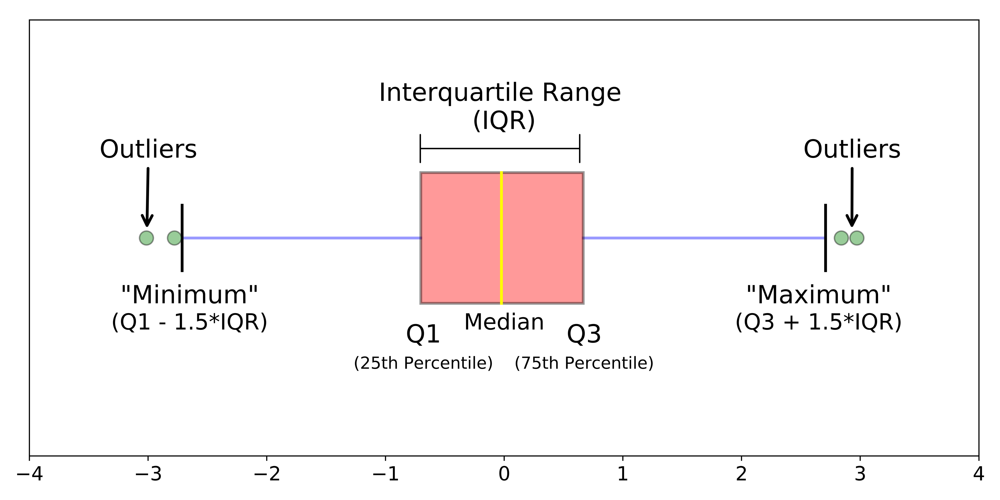

In [45]:
Image(filename="outliers.png",width=500)

In [46]:
# We must remove outliers in order to get a accurate dataset

In [47]:
# Lets concatenate the datasets (original,mean,median)
df_concatenated=pd.concat([df_numeric[nan_list],df_filled_mean[nan_list],df_filled_median[nan_list]],axis=1,keys=["original"
                                                                                                                 ,"mean"
                                                                                                                 ,"median"])

In [48]:
df_concatenated

original                               mean                            \
     LotFrontage MasVnrArea GarageYrBlt LotFrontage   MasVnrArea  GarageYrBlt   
0           65.0      196.0      2003.0   65.000000   196.000000  2003.000000   
1           80.0        0.0      1976.0   80.000000     0.000000  1976.000000   
2           68.0      162.0      2001.0   68.000000   162.000000  2001.000000   
3           60.0        0.0      1998.0   60.000000     0.000000  1998.000000   
4           84.0      350.0      2000.0   84.000000   350.000000  2000.000000   
5           85.0        0.0      1993.0   85.000000     0.000000  1993.000000   
6           75.0      186.0      2004.0   75.000000   186.000000  2004.000000   
7            NaN      240.0      1973.0   70.049958   240.000000  1973.000000   
8           51.0        0.0      1931.0   51.000000     0.000000  1931.000000   
9           50.0        0.0      1939.0   50.000000     0.000000  1939.000000   
10          70.0        0.0      1965.0   70.000000     0.000000  1965.000000   
11          85.0      286.0      2005.0   85.000000   286.000000  2005.000000   
12           NaN        0.0      1962.0   70.049958     0.000000  1962.000000   
13          91.0      306.0      2006.0   91.000000   306.000000  2006.000000   
14           NaN      212.0      1960.0   70.049958   212.000000  1960.000000   
15          51.0        0.0      1991.0   51.000000     0.000000  1991.000000   
16           NaN      180.0      1970.0   70.049958   180.000000  1970.000000   
17          72.0        0.0      1967.0   72.000000     0.000000  1967.000000   
18          66.0        0.0      2004.0   66.000000     0.000000  2004.000000   
19          70.0        0.0      1958.0   70.000000     0.000000  1958.000000   
20         101.0      380.0      2005.0  101.000000   380.000000  2005.000000   
21          57.0        0.0      1930.0   57.000000     0.000000  1930.000000   
22          75.0      281.0      2002.0   75.000000   281.000000  2002.000000   
23          44.0        0.0      1976.0   44.000000     0.000000  1976.000000   
24           NaN        0.0      1968.0   70.049958     0.000000  1968.000000   
25         110.0      640.0      2007.0  110.000000   640.000000  2007.000000   
26          60.0        0.0      2005.0   60.000000     0.000000  2005.000000   
27          98.0      200.0      2008.0   98.000000   200.000000  2008.000000   
28          47.0        0.0      1957.0   47.000000     0.000000  1957.000000   
29          60.0        0.0      1920.0   60.000000     0.000000  1920.000000   
30          50.0        0.0      1920.0   50.000000     0.000000  1920.000000   
31           NaN        0.0      1966.0   70.049958     0.000000  1966.000000   
32          85.0        0.0      2007.0   85.000000     0.000000  2007.000000   
33          70.0        0.0      1959.0   70.000000     0.000000  1959.000000   
34          60.0      246.0      2005.0   60.000000   246.000000  2005.000000   
35         108.0      132.0      2004.0  108.000000   132.000000  2004.000000   
36         112.0        0.0      1995.0  112.000000     0.000000  1995.000000   
37          74.0      650.0      1954.0   74.000000   650.000000  1954.000000   
38          68.0        0.0      1953.0   68.000000     0.000000  1953.000000   
39          65.0        0.0         NaN   65.000000     0.000000  1978.506164   
40          84.0      101.0      1965.0   84.000000   101.000000  1965.000000   
41         115.0        0.0      1959.0  115.000000     0.000000  1959.000000   
42           NaN        0.0      1983.0   70.049958     0.000000  1983.000000   
43           NaN        0.0      1977.0   70.049958     0.000000  1977.000000   
44          70.0        0.0      1959.0   70.000000     0.000000  1959.000000   
45          61.0      412.0      2005.0   61.000000   412.000000  2005.000000   
46          48.0        0.0      2003.0   48.000000     0.000000  2003.000000   
47          84.0        0.0      2006.0

In [49]:
df_concatenated[df_concatenated.isnull().any(axis=1)]

original                               mean                           \
     LotFrontage MasVnrArea GarageYrBlt LotFrontage  MasVnrArea  GarageYrBlt   
7            NaN      240.0      1973.0   70.049958  240.000000  1973.000000   
12           NaN        0.0      1962.0   70.049958    0.000000  1962.000000   
14           NaN      212.0      1960.0   70.049958  212.000000  1960.000000   
16           NaN      180.0      1970.0   70.049958  180.000000  1970.000000   
24           NaN        0.0      1968.0   70.049958    0.000000  1968.000000   
31           NaN        0.0      1966.0   70.049958    0.000000  1966.000000   
39          65.0        0.0         NaN   65.000000    0.000000  1978.506164   
42           NaN        0.0      1983.0   70.049958    0.000000  1983.000000   
43           NaN        0.0      1977.0   70.049958    0.000000  1977.000000   
48          33.0        0.0         NaN   33.000000    0.000000  1978.506164   
50           NaN        0.0      1997.0   70.049958    0.000000  1997.000000   
64           NaN      573.0      1998.0   70.049958  573.000000  1998.000000   
66           NaN      287.0      1970.0   70.049958  287.000000  1970.000000   
76           NaN        0.0      1956.0   70.049958    0.000000  1956.000000   
78          72.0        0.0         NaN   72.000000    0.000000  1978.506164   
84           NaN       22.0      1995.0   70.049958   22.000000  1995.000000   
88         105.0        0.0         NaN  105.000000    0.000000  1978.506164   
89          60.0        0.0         NaN   60.000000    0.000000  1978.506164   
95           NaN       68.0      1993.0   70.049958   68.000000  1993.000000   
99          77.0        0.0         NaN   77.000000    0.000000  1978.506164   
100          NaN       28.0      1977.0   70.049958   28.000000  1977.000000   
104          NaN      600.0      1951.0   70.049958  600.000000  1951.000000   
108         85.0        0.0         NaN   85.000000    0.000000  1978.506164   
111          NaN        0.0      2000.0   70.049958    0.000000  2000.000000   
113          NaN      184.0      1953.0   70.049958  184.000000  1953.000000   
116          NaN      116.0      1962.0   70.049958  116.000000  1962.000000   
120          NaN        0.0      1969.0   70.049958    0.000000  1969.000000   
125         60.0        0.0         NaN   60.000000    0.000000  1978.506164   
126          NaN        0.0      1977.0   70.049958    0.000000  1977.000000   
127         55.0        0.0         NaN   55.000000    0.000000  1978.506164   
131          NaN       40.0      2000.0   70.049958   40.000000  2000.000000   
133          NaN      136.0      2001.0   70.049958  136.000000  2001.000000   
136          NaN      196.0      1967.0   70.049958  196.000000  1967.000000   
140         70.0        0.0         NaN   70.000000    0.000000  1978.506164   
147          NaN      180.0      2001.0   70.049958  180.000000  2001.000000   
148         63.0      120.0         NaN   63.000000  120.000000  1978.506164   
149          NaN        0.0      1936.0   70.049958    0.000000  1936.000000   
152          NaN      252.0      1971.0   70.049958  252.000000  1971.000000   
153          NaN        0.0      1960.0   70.049958    0.000000  1960.000000   
155         60.0        0.0         NaN   60.000000    0.000000  1978.506164   
160          NaN        0.0      1984.0   70.049958    0.000000  1984.000000   
163         55.0        0.0         NaN   55.000000    0.000000  1978.506164   
165         62.0        0.0         NaN   62.000000    0.000000  1978.506164   
166          NaN        0.0      1955.0   70.049958    0.000000  1955.000000   
169          NaN      653.0      1981.0   70.049958  653.000000  1981.000000   
170          NaN        0.0      1991.0   70.049958    0.000000  1991.000000   
177          NaN        0.0      1958.0   70.049958    0.000000  1958.000000   
180          NaN      456.0      2000.0   70.049958  456.000000  2000.000000   
186     